In [1]:
import pandas as pd
from tqdm import tqdm
import os
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import re
import textwrap
from dna_features_viewer import GraphicFeature, GraphicRecord
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
import matplotlib.text as mtext

In [3]:
def assign_hhblits_hit(hit_name):
    if '~' in hit_name:
        return 'defense'
    elif 'PF' == hit_name[:2]:
        return 'pfam'
    elif '|' in hit_name:
        return 'innate'
    else:
        return 'pdb'

In [4]:
def select_domains(hhblits_df, prob_cutoff=50):
    out_list = []
    for group, group_df in hhblits_df[(hhblits_df['Prob'] > prob_cutoff)].groupby('query'):
        group_df = group_df.sort_values('Prob', ascending=False)
        while len(group_df):
            selected_row = group_df.head(1).squeeze()
            out_list.append(selected_row)
            group_df = group_df[(group_df['qend'] < selected_row['qstart']) |
                                (group_df['qstart'] > selected_row['qend'])]
    selected_domain_df = pd.concat(out_list, axis=1).T
    selected_domain_df['wrapped_name'] = [textwrap.fill(text, width=60) for text in selected_domain_df['hit_name']]
    selected_domain_df['display_name'] = selected_domain_df['wrapped_name'] + ' (Pr=' + selected_domain_df['Prob'].astype(str) + ')'
    selected_domain_df['display_start'] = (selected_domain_df['qstart'] - 1)*3
    selected_domain_df['display_end'] = (selected_domain_df['qend'] - 1)*3
    return selected_domain_df

In [5]:
def plot_neighborhood(full_neighborhood_df, feature_color_mapping=None, 
                      cmap=None, ax=None):
    if ax is None:
        ax = plt.gca()
    if cmap is None:
        cmap = matplotlib.colormaps.get_cmap('viridis')
    if feature_color_mapping is None:
        feature_color_mapping = {'CDS': '#e69f00',
                                 'pseudo': '#ffdc8f',
                                 'tRNA': '#56b4e9',
                                 'tmRNA': '#56b4e9',
                                 'riboswitch': '#56b4e9',
                                 'sequence_feature': '#56b4e9'}
    max_loc = full_neighborhood_df['end'].max()
    min_loc = full_neighborhood_df['start'].min()
    feature_len = max_loc - min_loc
    features = []
    for _, row in full_neighborhood_df.iterrows():
        if not pd.isna(row['attributes']) and ('pseudo' in row['attributes']):
            color='darkgrey'
        elif not pd.isna(row['beaker_prediction']):
            color = cmap(row['beaker_prediction'])
        else:
            color='white'
        if (row['name'] == 'hypothetical protein') or \
                (row['name'] == ''):
            label = None
        else:
            label = row['name']
        if not pd.isna(row['center_operon']) and row['center_operon']:
            linewidth = 3
        else:
            linewidth = 1
        linecolor = 'black'
        if row['defense_homolog']:
            linecolor = 'grey'                
        if row['strand'] == '+':
            strand = 1
        else:
            strand = -1
        start = row['start'] - min_loc
        end = row['end'] - min_loc
        ft = GraphicFeature(start=start, end=end, strand=strand,
                            color=color, label=label, linewidth=linewidth, 
                            linecolor=linecolor)
        features.append(ft)
    record = GraphicRecord(features = features, sequence_length=feature_len)
    record.plot(ax=ax)
    norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    plt.colorbar(sm, label='Beaker p(defense)', ax=ax, location='top', shrink=0.5)

In [6]:
def plot_domains(domain_df, min_loc, ax, name, start_col, end_col, display_col,
                 palette=sns.color_palette("tab20")):
    if name == 'tm':
        palette = {'outside': '#a6cee3',
                   'TMhelix': '#1f78b4',
                   'signal': '#b2df8a'}
    domain_df['dom_genome_start'] = domain_df[start_col] + domain_df['start']
    domain_df['dom_genome_end'] = domain_df[end_col] + domain_df['start']
    domain_df['dom_plot_start'] = domain_df['dom_genome_start'] - min_loc
    domain_df['dom_plot_end'] = domain_df['dom_genome_end'] - min_loc
    domain_df['dom_len'] = domain_df[end_col] - domain_df[start_col]
    domain_df = (domain_df.sort_values('dom_plot_start', ascending=True)
                 .reset_index(drop=True))
    domain_rectangles = []
    for i, (_, row) in enumerate(domain_df.iterrows()):
        label = row[display_col]
        if name == 'tm':
            c = palette[label]
        else:
            c = palette[i % len(palette)]
        rect = Rectangle((row['dom_plot_start'], 0), row['dom_len'], 1, 
                         color=c, label=label)
        ax.add_patch(rect)
    ax.set_yticks([0.5])
    ax.set_yticklabels([name])
    handles, labels = ax.get_legend_handles_labels()
    handles = [name] + handles
    labels = [''] + labels
    sns.despine()
    return handles, labels

In [7]:
class LegendTitle(object):
    def __init__(self, text_props=None):
        self.text_props = text_props or {}
        super(LegendTitle, self).__init__()

    def legend_artist(self, legend, orig_handle, fontsize, handlebox):
        x0, y0 = handlebox.xdescent, handlebox.ydescent
        title = mtext.Text(x0, y0, orig_handle,  **self.text_props)
        handlebox.add_artist(title)
        return title


In [8]:
assemblies_dir = '../data/interim/ecor_assemblies/'
feature_files = [f for f in os.listdir(assemblies_dir) if '.txt' in f]
feature_file_list = list()
for f in tqdm(feature_files):
    feature_file_list.append(pd.read_table(assemblies_dir + f))
feature_df = pd.concat(feature_file_list)

100%|██████████| 69/69 [00:12<00:00,  5.32it/s]


In [9]:
minimal_pd_operon_df = pd.read_csv('../data/interim/ecor_minimal_pd_operons.csv')
ecor_predictions = pd.read_csv('../data/interim/ecor_predictions.csv')

## Sample Operons

In [14]:
n_samples = 50
sampled_operons = minimal_pd_operon_df['operon'].drop_duplicates().sample(n=50, random_state=7).to_list()
sampled_operon_df = minimal_pd_operon_df.loc[minimal_pd_operon_df['operon'].isin(sampled_operons)]
print('# cloned operons:', sampled_operon_df.loc[sampled_operon_df['cloned'], 'operon'].nunique())

# cloned operons: 7


In [10]:
pd_operon_max_prob = (minimal_pd_operon_df.groupby('operon')
                      .agg(max_p_defense = ('beaker_prediction', 'max'))
                      .reset_index())
sample_operon_max_prob = (sampled_operon_df.groupby('operon')
                      .agg(max_p_defense = ('beaker_prediction', 'max'))
                      .reset_index())

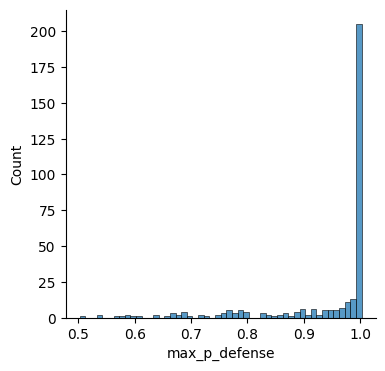

In [11]:
plt.subplots(figsize=(4,4))
sns.histplot(data=pd_operon_max_prob,
             x='max_p_defense', binwidth=0.01)
sns.despine()

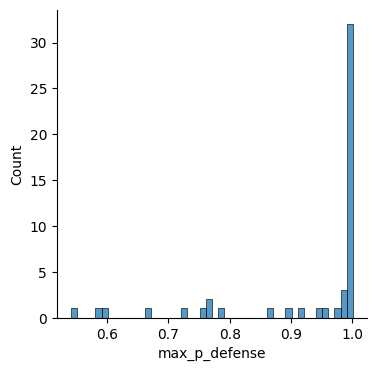

In [12]:
plt.subplots(figsize=(4,4))
sns.histplot(data=sample_operon_max_prob,
             x='max_p_defense', binwidth=0.01)
sns.despine()

## Run HHpred on sampled operons

In [18]:
sampled_operon_proteins = sampled_operon_df['product_accession'].drop_duplicates()
out_sampled_protein_accs = '../data/interim/ecor_sampled_proteins.txt'
sampled_operon_proteins.to_csv(out_sampled_protein_accs, index=False)
out_sampled_protein_faa = '../data/interim/ecor_sampled_proteins.faa'
os.system(' '.join(['conda run -n beaker', 
                    'seqtk subseq', 
                    '../data/interim/ecor_unique_seqs.faa', 
                    out_sampled_protein_accs, '>' , 
                    out_sampled_protein_faa]))

0

In [23]:
out_sampled_protein_accs

'../data/interim/ecor_sampled_proteins.txt'

In [39]:
msa_dir = '../data/interim/ecor_sample_protein_msas/'
if 'ecor_sample_protein_msas' not in os.listdir('../data/interim/'):
    os.mkdir(msa_dir)
filt_1_msa_dir = '../data/interim/pd_filt_1_msas/'
pd_filt_1_msas = os.listdir(filt_1_msa_dir)
n_prebuilt = 0
for acc in sampled_operon_proteins:
    acc_f = acc + '.a3m'
    if acc_f in pd_filt_1_msas:
        os.system(' '.join(['cp', os.path.join(filt_1_msa_dir, acc_f), os.path.join(msa_dir, acc_f)]))
        n_prebuilt += 1
print(n_prebuilt, 'MSAs prebuilt of', len(sampled_operon_proteins), 'total')   

61 MSAs prebuilt of 94


In [13]:
hhblits_out_f = '../data/interim/ecor_sample_hhblits_out.csv'
hhblits_ali_dir = '../data/interim/ecor_sample_hhblits_db_alis/'

In [40]:
os.system(' '.join(['conda run -n hhpred python',
                    '~/Documents/hhpred/code/hhpred.py', 
                    hhblits_ali_dir, hhblits_out_f, 
                    '--dbs pfam innate df pdb', 
                    '--in_fasta', out_sampled_protein_faa, 
                    '--n_iter 2', 
                    '--alignment_dir', msa_dir, 
                    '--n_jobs 40', 
                    '--reuse_msas']))

Building multiple sequence alignments from fasta
Wirting out individual fasta files to ~/Documents/hhpred/data/temp/temp_fasta/
Wirting out MSAs from uniclust to ../data/interim/ecor_sample_protein_msas/
Reusing MSAs
Generating multiple sequence alignments with 2 iterations of HHblits
Querying pfam, innate, df, pdb database(s)



100%|██████████| 94/94 [00:14<00:00,  6.40it/s] 



0

In [14]:
hhblits_df = pd.read_csv(hhblits_out_f)
hhblits_df['category'] = hhblits_df['hit_name'].apply(assign_hhblits_hit)
hhblits_df['category'].value_counts()

category
pdb        8854
pfam       4394
defense    2069
innate     1348
Name: count, dtype: int64

## Visualize operons

### Transmembrane regions

In [15]:
tm_out_list = list()
columns = ['product_accession', 'display_name', 'start', 'end']
reading = False
for line in open('../data/external/ecor_sampled_TMRs.gff3'):
    if (line[0] == '#') or (line.strip() == '//'):
        continue
    elif 'inside' in line:
        continue
    else:
        split_line = line.strip().split('\t')
        out_dict = dict()
        for k, v in zip(columns, split_line):
            if k in ['start', 'end']:
                v = int(v)
            out_dict[k] = v
        tm_out_list.append(out_dict)
tm_out_df = pd.DataFrame(tm_out_list) 
tm_out_df['display_start'] = (tm_out_df['start'] - 1)*3 
tm_out_df['display_end'] = (tm_out_df['end'] - 1)*3
tm_out_df = tm_out_df[tm_out_df['display_name'] != 'inside']

### Top Alignment

In [16]:
top_alignment_dict = dict()
for category, category_df in hhblits_df.groupby('category'):
    top_alignment_dict[category] = select_domains(category_df)

### Plot

In [17]:
sorted_predictions = (ecor_predictions.sort_values(['genomic_accession', 'start'])
                      .reset_index(drop=True))
sorted_predictions['query'] = sorted_predictions['product_accession'].str.split('.', expand=True)[0]

In [18]:
domain_palette_mapping = {'defense': sns.color_palette('Set2'), 
                          'pfam': sns.color_palette('Pastel1'), 
                          'innate': sns.color_palette('tab10'), 
                          'pdb': sns.color_palette('Paired')}

  0%|          | 0/50 [00:00<?, ?it/s]

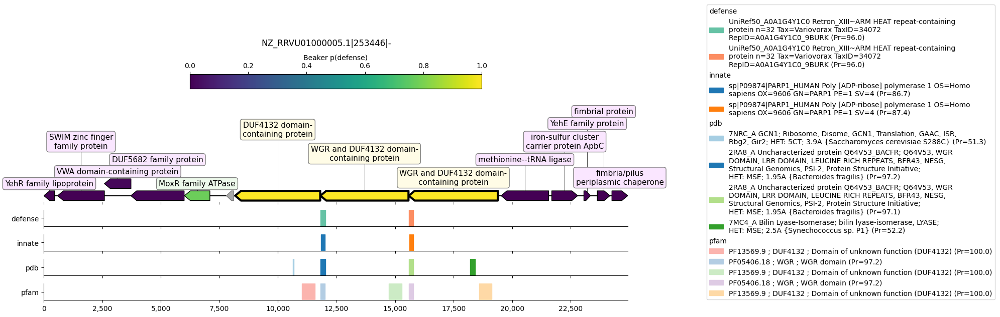

  2%|▏         | 1/50 [00:03<03:04,  3.76s/it]

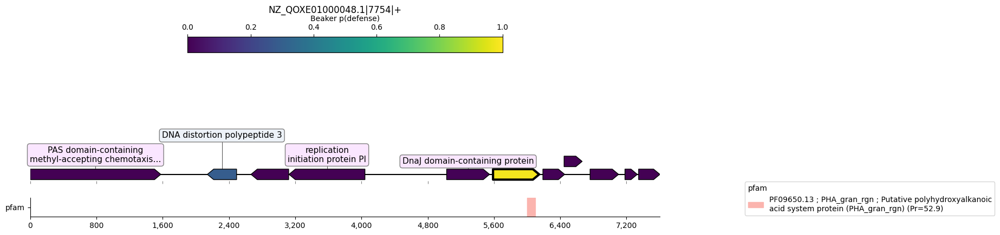

  4%|▍         | 2/50 [00:05<01:51,  2.31s/it]

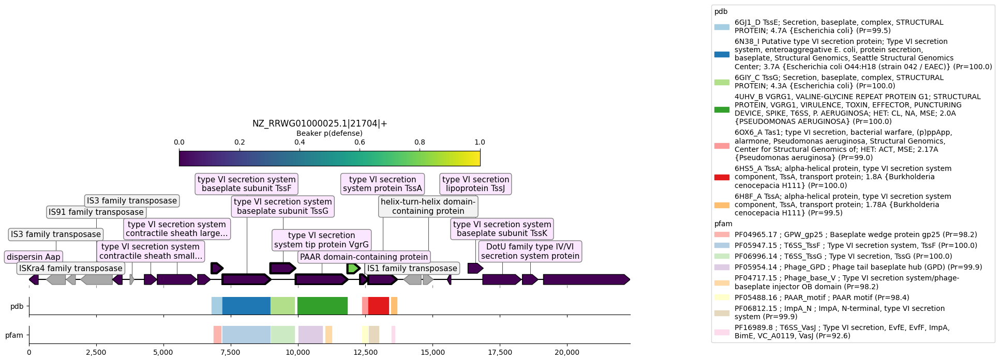

  6%|▌         | 3/50 [00:08<02:11,  2.81s/it]

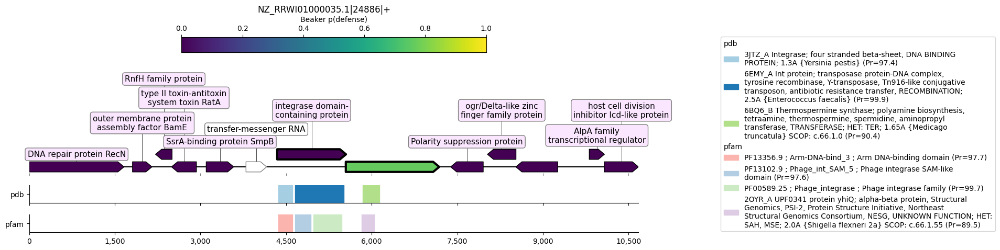

  8%|▊         | 4/50 [00:10<02:00,  2.62s/it]

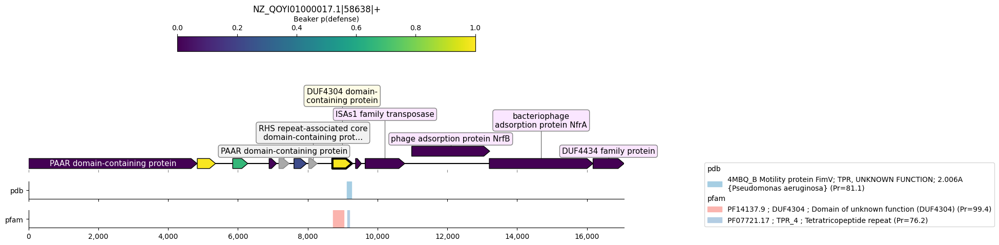

 10%|█         | 5/50 [00:12<01:42,  2.29s/it]

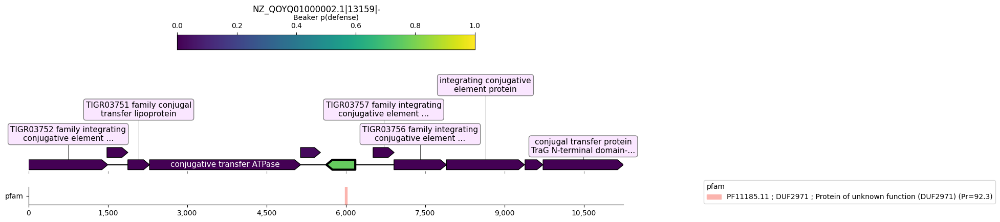

 12%|█▏        | 6/50 [00:13<01:27,  1.99s/it]

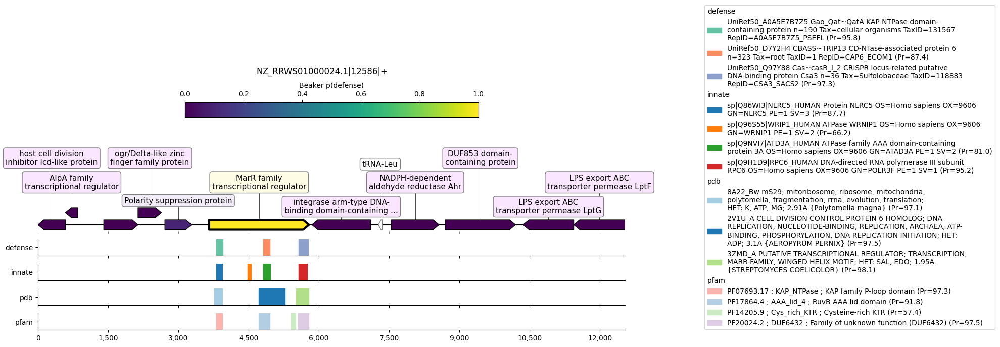

 14%|█▍        | 7/50 [00:17<01:46,  2.48s/it]

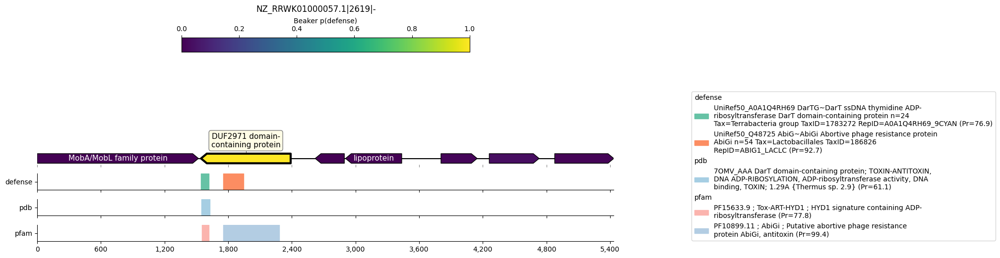

 16%|█▌        | 8/50 [00:19<01:37,  2.33s/it]

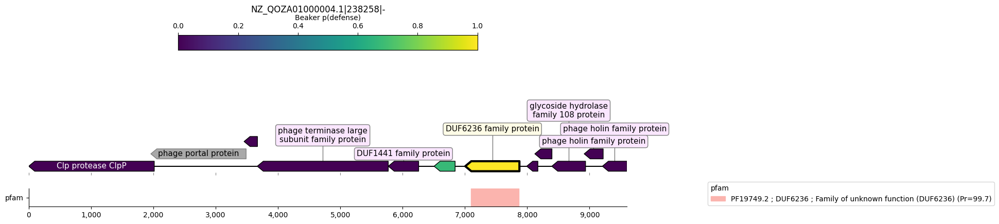

 18%|█▊        | 9/50 [00:20<01:23,  2.03s/it]

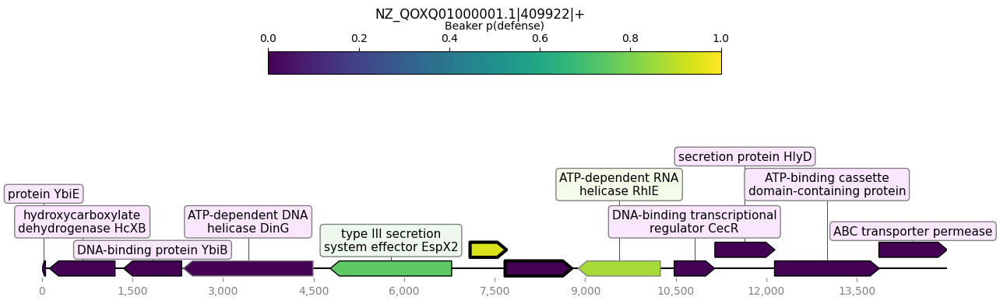

 20%|██        | 10/50 [00:21<01:10,  1.75s/it]

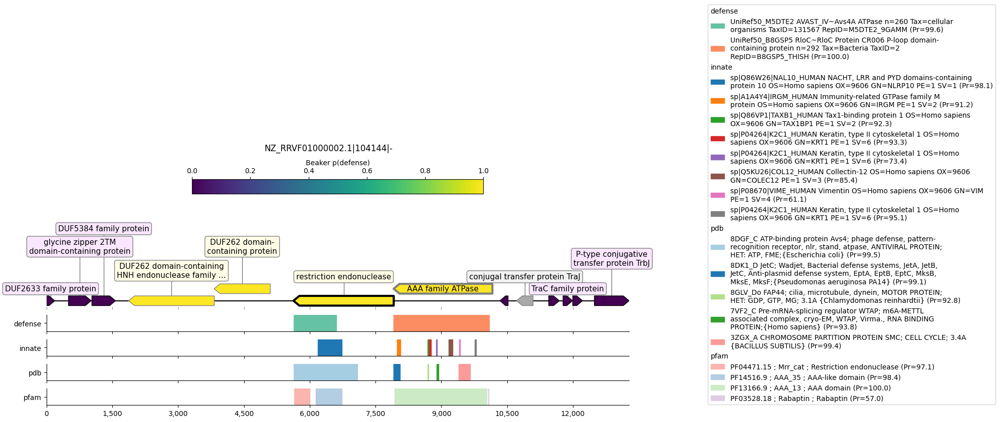

 22%|██▏       | 11/50 [00:25<01:33,  2.39s/it]

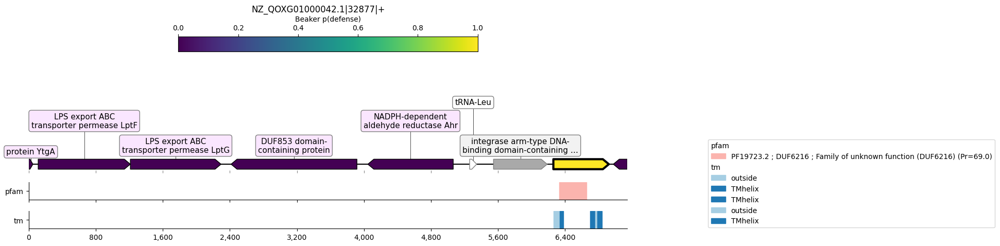

 24%|██▍       | 12/50 [00:27<01:21,  2.16s/it]

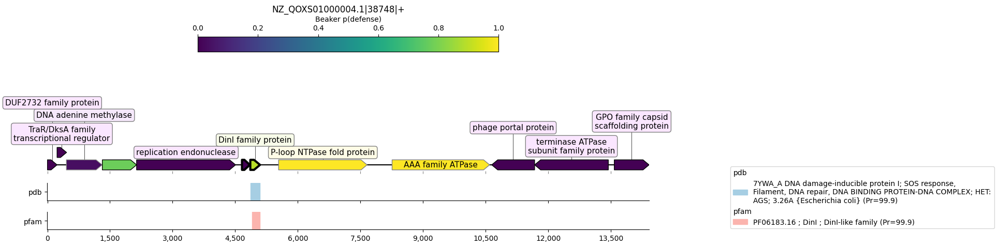

 26%|██▌       | 13/50 [00:29<01:14,  2.02s/it]

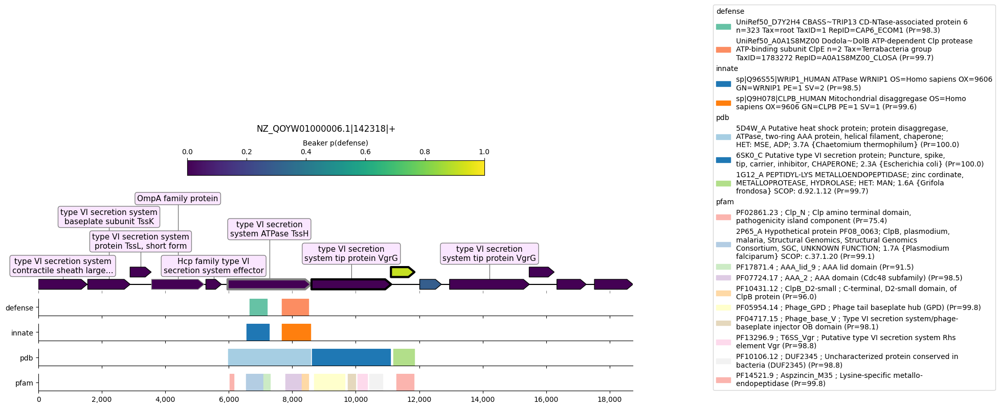

 28%|██▊       | 14/50 [00:32<01:29,  2.48s/it]

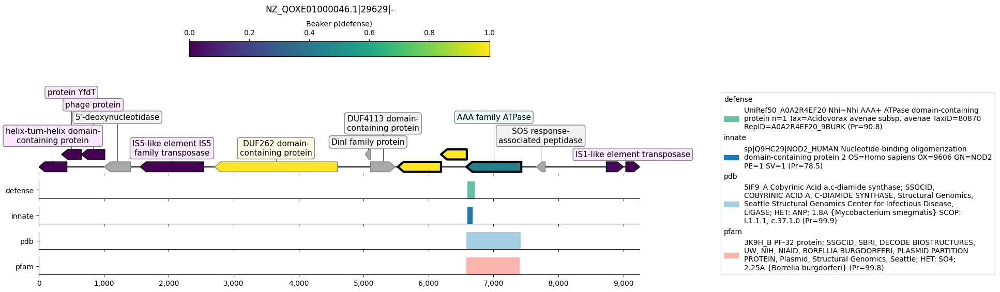

 30%|███       | 15/50 [00:35<01:26,  2.47s/it]

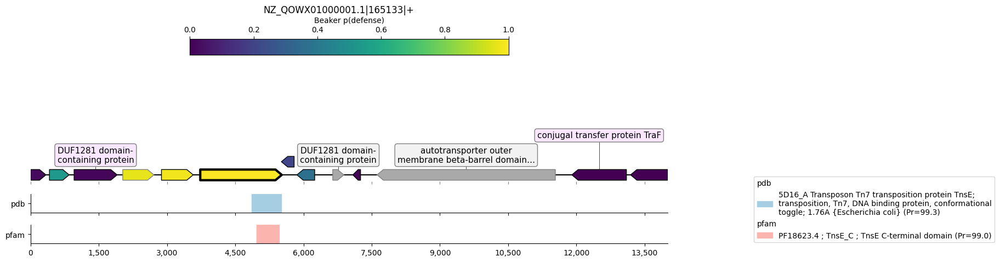

 32%|███▏      | 16/50 [00:36<01:15,  2.22s/it]

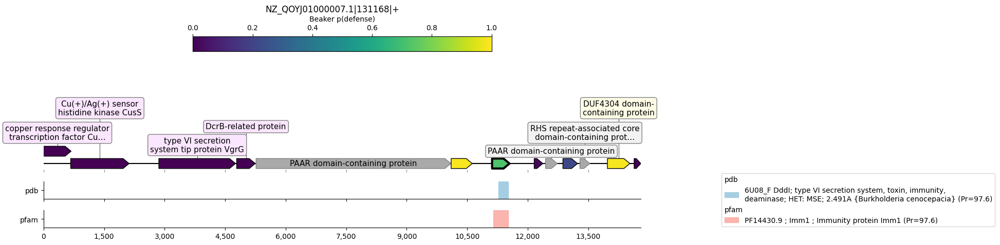

 34%|███▍      | 17/50 [00:38<01:08,  2.06s/it]

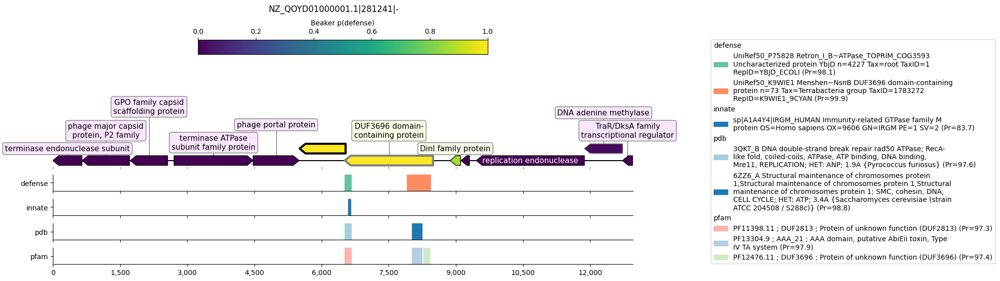

 36%|███▌      | 18/50 [00:41<01:12,  2.26s/it]

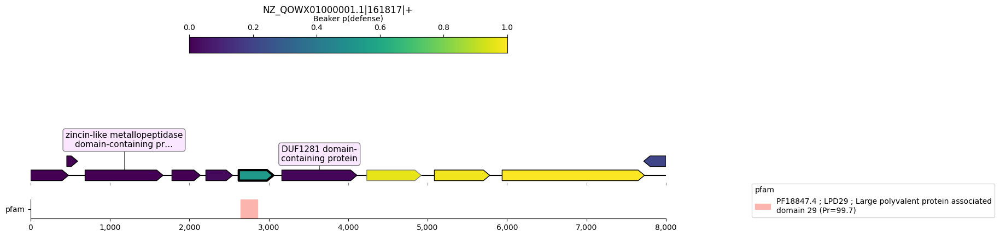

 38%|███▊      | 19/50 [00:42<01:00,  1.94s/it]

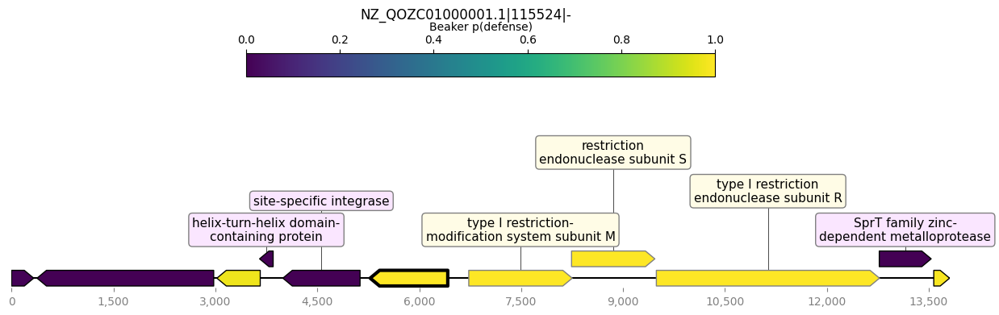

 40%|████      | 20/50 [00:43<00:50,  1.67s/it]

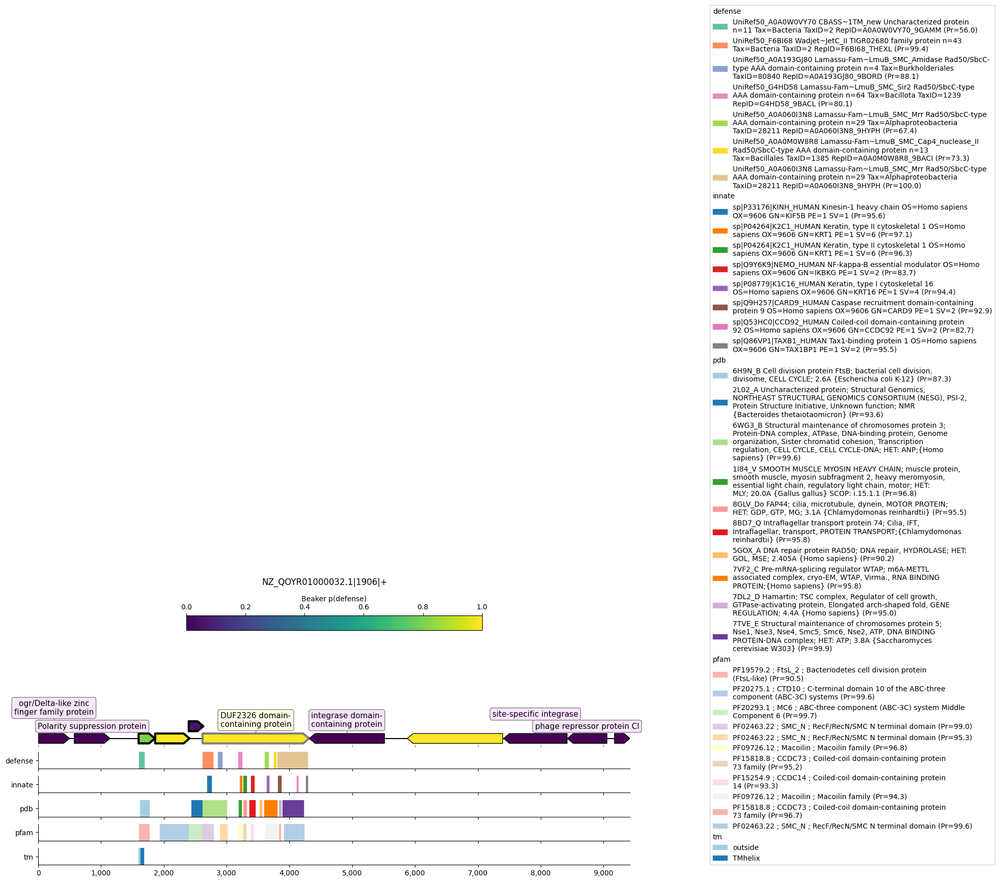

 42%|████▏     | 21/50 [00:49<01:30,  3.11s/it]

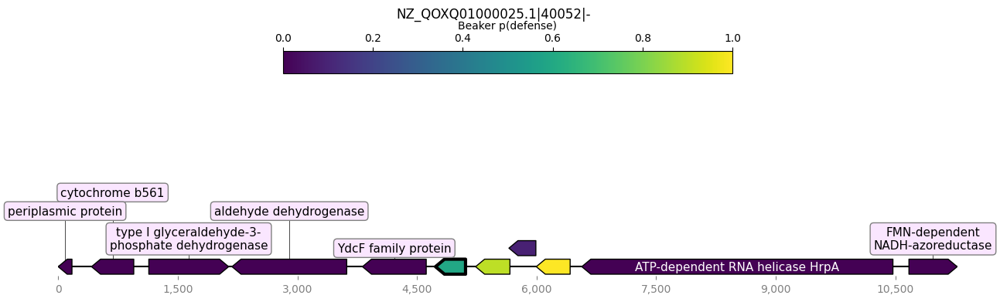

 44%|████▍     | 22/50 [00:50<01:09,  2.47s/it]

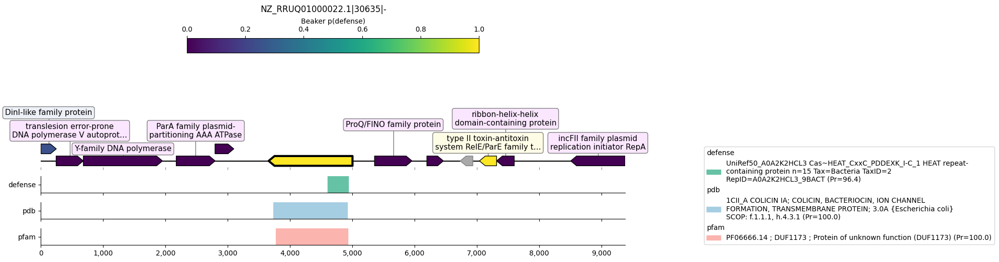

 46%|████▌     | 23/50 [00:52<01:02,  2.33s/it]

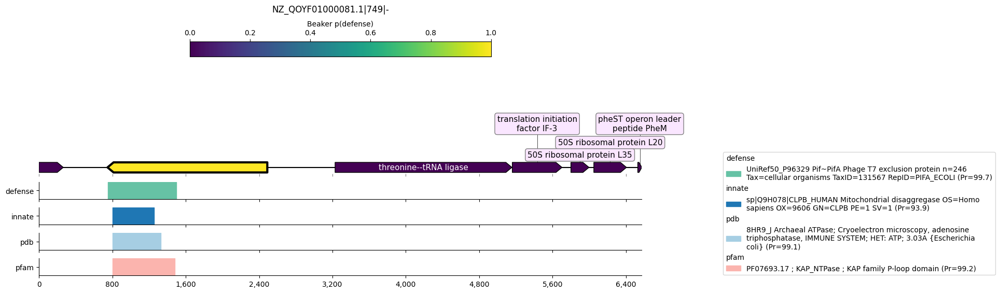

 48%|████▊     | 24/50 [00:54<00:58,  2.23s/it]

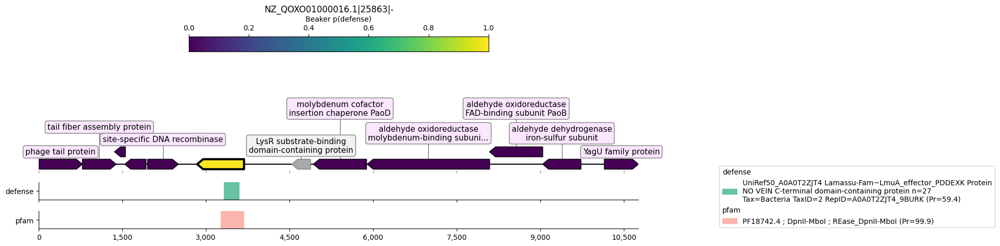

 50%|█████     | 25/50 [00:56<00:51,  2.08s/it]

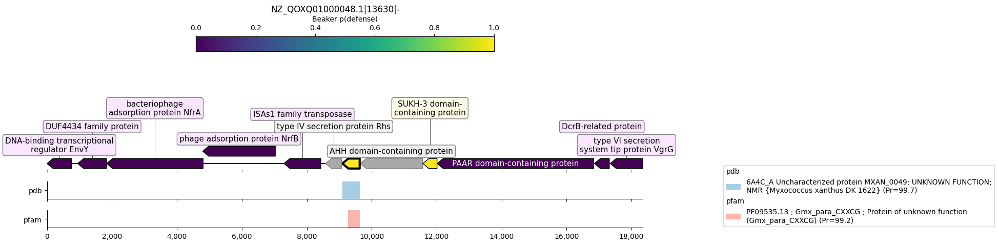

 52%|█████▏    | 26/50 [00:58<00:48,  2.02s/it]

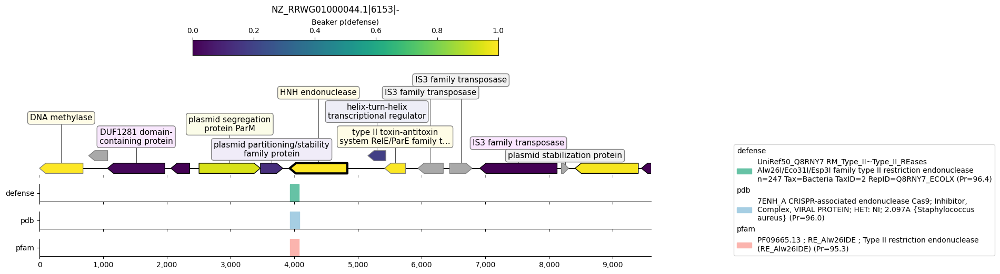

 54%|█████▍    | 27/50 [01:00<00:46,  2.03s/it]

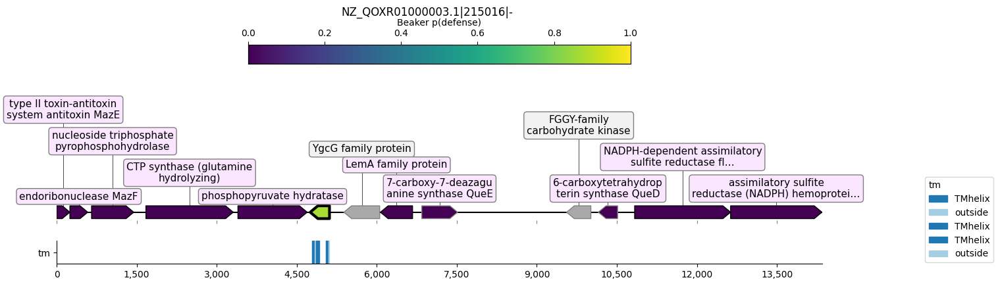

 56%|█████▌    | 28/50 [01:02<00:41,  1.89s/it]

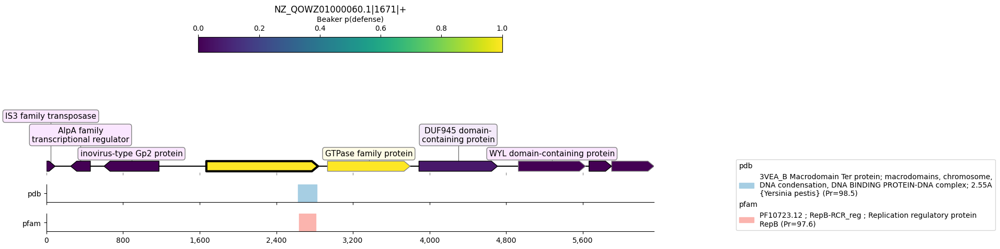

 58%|█████▊    | 29/50 [01:03<00:37,  1.79s/it]

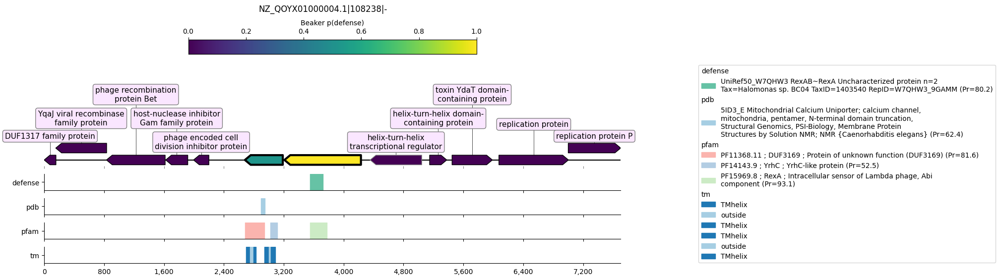

 60%|██████    | 30/50 [01:06<00:40,  2.01s/it]

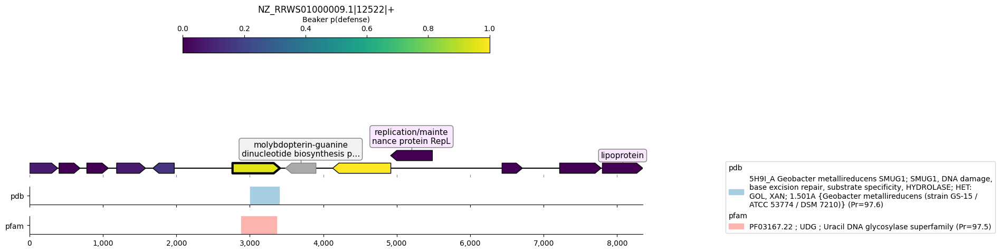

 62%|██████▏   | 31/50 [01:07<00:36,  1.90s/it]

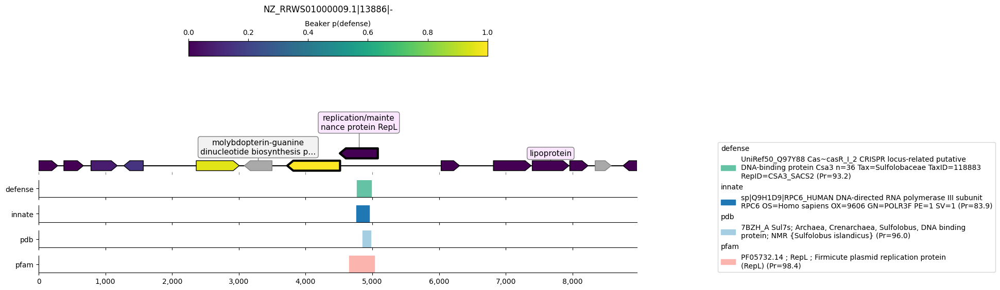

 64%|██████▍   | 32/50 [01:09<00:34,  1.94s/it]

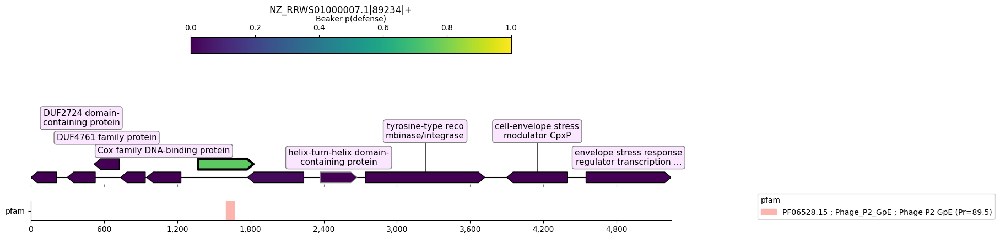

 66%|██████▌   | 33/50 [01:11<00:29,  1.76s/it]

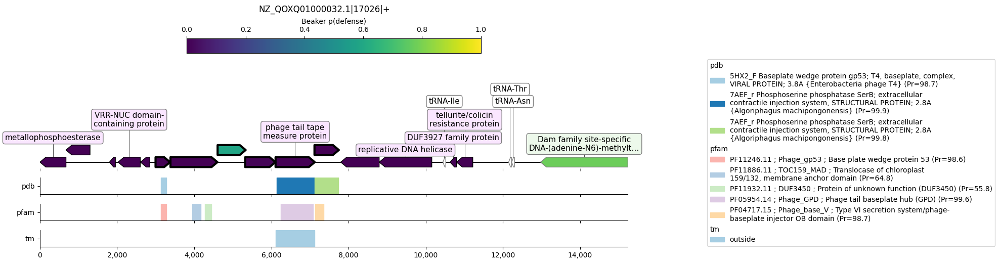

 68%|██████▊   | 34/50 [01:13<00:31,  1.94s/it]

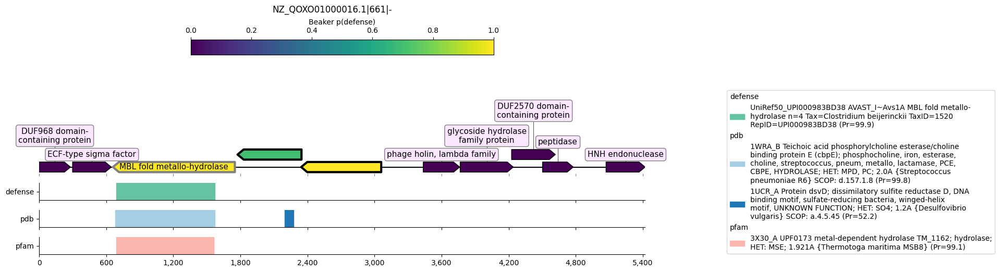

 70%|███████   | 35/50 [01:15<00:29,  2.00s/it]

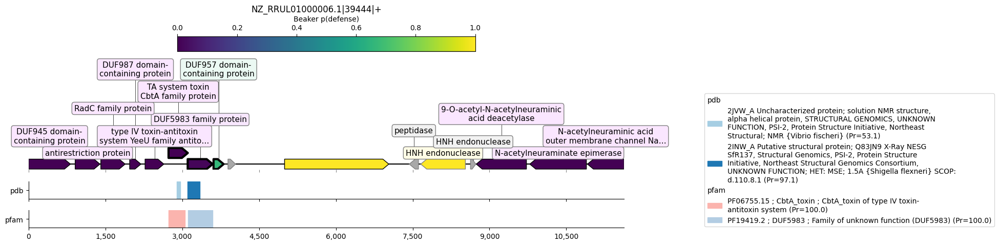

 72%|███████▏  | 36/50 [01:17<00:29,  2.08s/it]

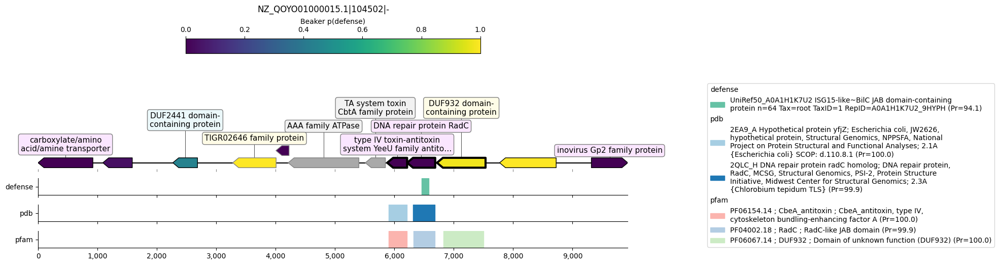

 74%|███████▍  | 37/50 [01:20<00:27,  2.15s/it]

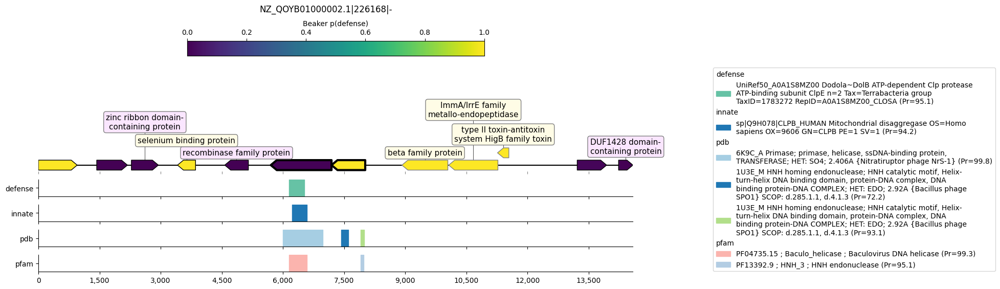

 76%|███████▌  | 38/50 [01:22<00:27,  2.25s/it]

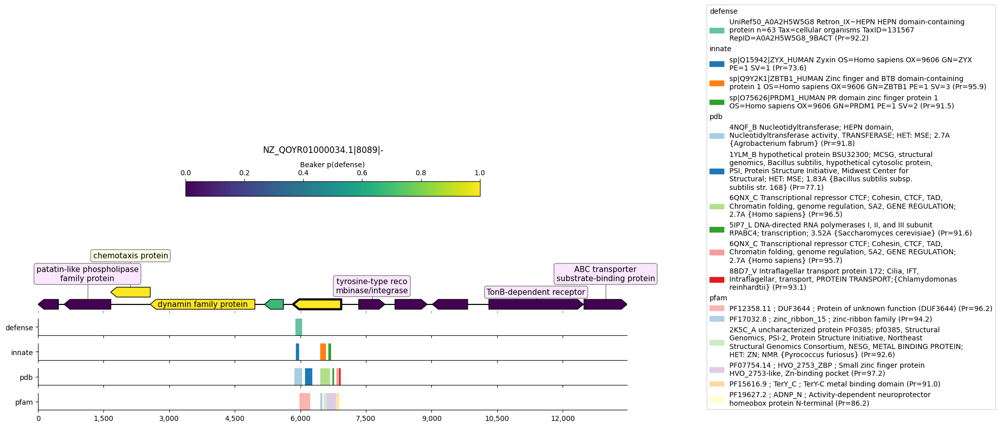

 78%|███████▊  | 39/50 [01:26<00:29,  2.64s/it]

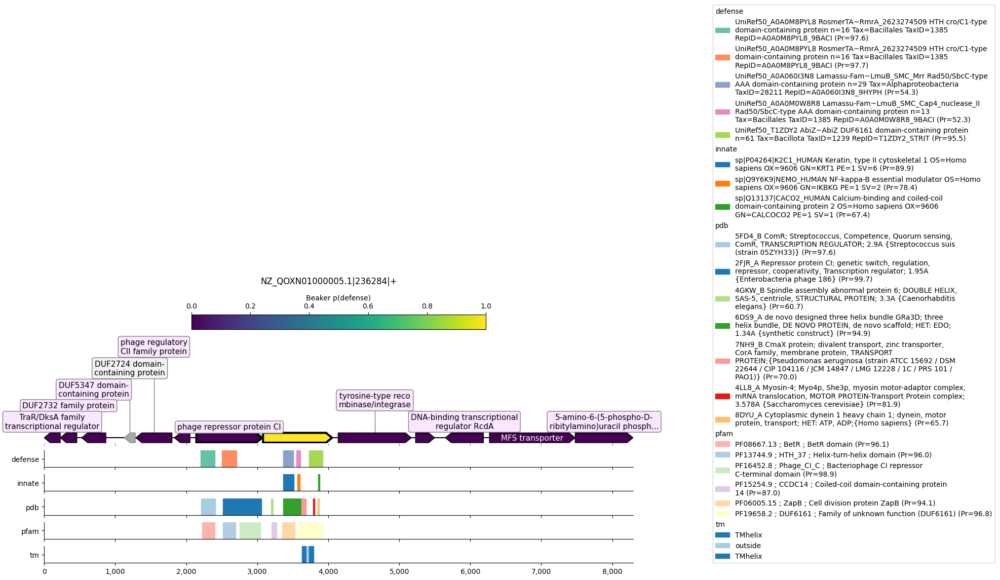

 80%|████████  | 40/50 [01:30<00:32,  3.28s/it]

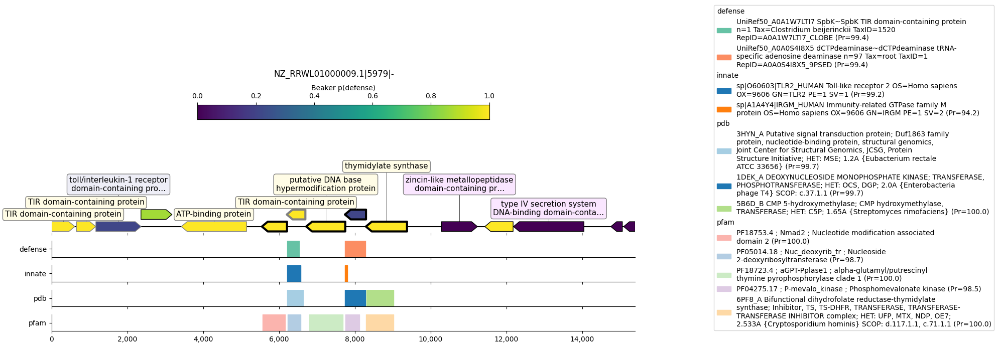

 82%|████████▏ | 41/50 [01:34<00:29,  3.26s/it]

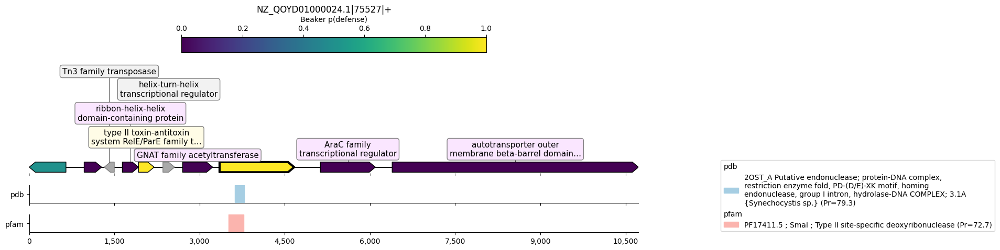

 84%|████████▍ | 42/50 [01:35<00:22,  2.79s/it]

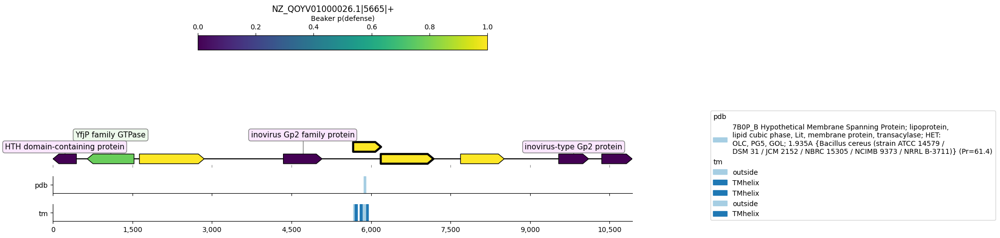

 86%|████████▌ | 43/50 [01:37<00:16,  2.43s/it]

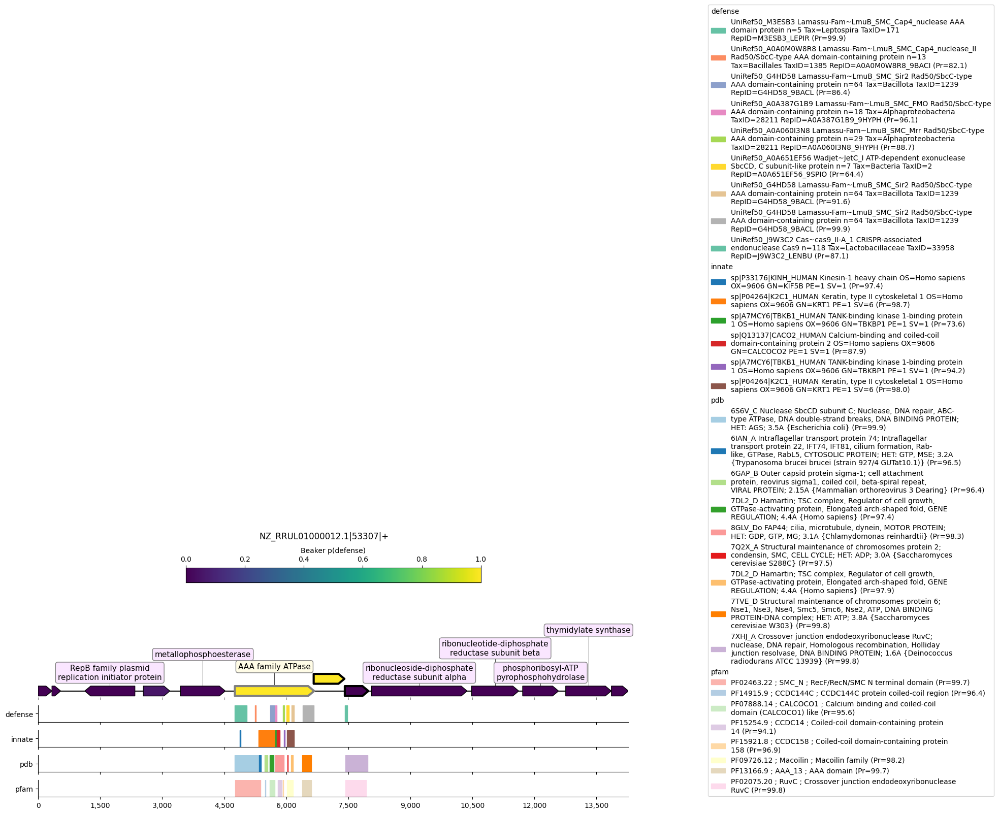

 88%|████████▊ | 44/50 [01:43<00:21,  3.51s/it]

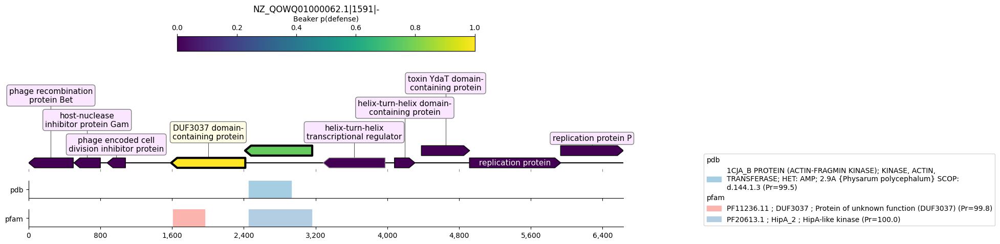

 90%|█████████ | 45/50 [01:45<00:14,  2.98s/it]

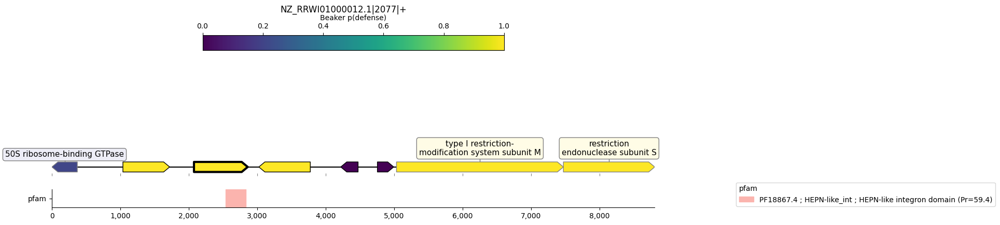

 92%|█████████▏| 46/50 [01:46<00:09,  2.45s/it]

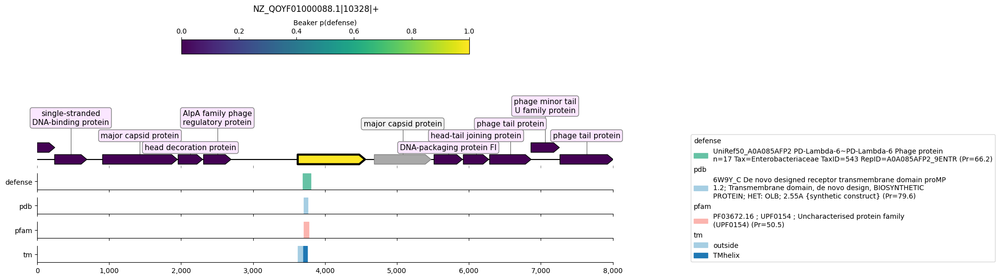

 94%|█████████▍| 47/50 [01:48<00:07,  2.36s/it]

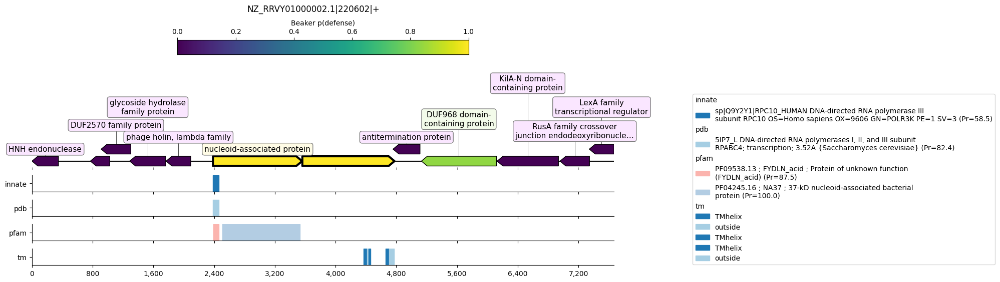

 96%|█████████▌| 48/50 [01:51<00:04,  2.38s/it]

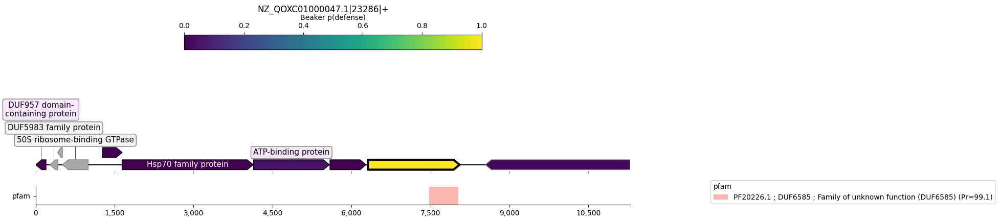

 98%|█████████▊| 49/50 [01:52<00:02,  2.10s/it]

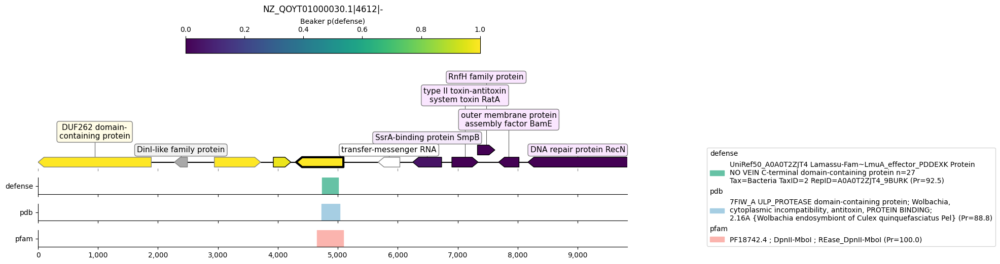

100%|██████████| 50/50 [01:54<00:00,  2.29s/it]


In [31]:
neighbors = 5
neighbor_list = []
for operon in tqdm(sampled_operons):
    # genomic context 
    genomic_locus = re.split('\|', operon)[0]
    operon_df = sorted_predictions[sorted_predictions['operon'] == operon]
    operon_indeces = operon_df.index
    operon_max_index = max(operon_indeces)
    operon_min_index = min(operon_indeces)
    neighborhood_df = sorted_predictions.iloc[max(operon_min_index - neighbors, 0):
                                              min(operon_max_index + neighbors +1, len(sorted_predictions))]
    neighborhood_df = neighborhood_df[neighborhood_df['genomic_accession'] == genomic_locus]
    neighborhood_df['center_operon'] = neighborhood_df['operon'] == operon
    full_neighborhood_df = feature_df[(feature_df['genomic_accession'] == genomic_locus)]
    full_neighborhood_df = full_neighborhood_df[(full_neighborhood_df['start'] >= neighborhood_df['start'].min()) & 
                                                (full_neighborhood_df['end'] <= neighborhood_df['end'].max())]
    full_neighborhood_df = full_neighborhood_df[full_neighborhood_df['# feature'] != 'gene']
    full_neighborhood_df = (full_neighborhood_df
                            .merge(neighborhood_df[['genomic_accession', 'start', 'product_accession', 'strand', 
                                                    'beaker_prediction', 'defense_homolog', 
                                                    'center_operon', 'operon']], 
                                   how='left', on=['genomic_accession', 'start', 'product_accession', 'strand']))
    neighbor_list.append(full_neighborhood_df)
    domain_tuples = list()
    for category, category_df in top_alignment_dict.items():
        operon_domain_df = operon_df.merge(category_df, how='inner', on='query')
        if len(operon_domain_df):
            category_palette = domain_palette_mapping[category]
            domain_tuples.append((operon_domain_df, category, category_palette))
    operon_tm_df = (operon_df.merge(tm_out_df, how='inner', on='product_accession', 
                                    suffixes=('', '_tm')))
    if len(operon_tm_df):
        domain_tuples.append((operon_tm_df, 'tm', None))
    n_tracks = len(domain_tuples)
    if n_tracks:
        fig, axs = plt.subplots(n_tracks + 1, figsize=(15, 4 + 0.5*n_tracks), 
                                gridspec_kw={'height_ratios': [4] + [0.5]*n_tracks}, 
                                sharex=True)
        ax0 = axs[0]
        plot_neighborhood(full_neighborhood_df, ax=ax0)
        min_loc = full_neighborhood_df['start'].min()
        all_handles = []
        all_labels = []
        for (ax, (df, name, palette)) in zip(axs[1:], domain_tuples):
            handles, labels = plot_domains(df, min_loc, ax, 
                                       name, 'display_start', 'display_end', 'display_name',
                                       palette=palette)
            all_handles.extend(handles)
            all_labels.extend(labels)
        fig.legend(all_handles, all_labels, loc='lower left', bbox_to_anchor=(1, 0.1), 
                   handler_map={str: LegendTitle({'fontsize': 10})})
    else:
        fig, ax0 = plt.subplots(1, 1, figsize=(15, 4))
        plot_neighborhood(full_neighborhood_df, ax=ax0)
    fig.suptitle(operon)
    plt.savefig('../figures/predicted_defense/' + operon + '.png', dpi=300, bbox_inches='tight')
    plt.show()
    

In [28]:
operon_summary_df = (sampled_operon_df.groupby(['operon', 'cloned', 'genomic_accession'])
                     .agg(min_prediction=('beaker_prediction', 'min'), 
                          max_prediction=('beaker_prediction', 'max'), 
                          n_proteins=('product_accession', 'count'), 
                          product_accessions=('product_accession', lambda x: ','.join(x)), 
                          total_protein_len=('product_length', 'sum'), 
                          defense_homologs=('defense_homolog', 'sum'))
                     .reset_index())

In [29]:
operon_summary_df.to_csv('../data/interim/ecor_random_validation_library.csv', index=False)